In [1]:
import sys
import os
_path = os.path.abspath('../')
if _path not in sys.path:
    sys.path.insert(0, _path)

import warnings
warnings.filterwarnings('ignore')
    
import arviz as az
import astropy.coordinates as coord
import astropy.table as at
import astropy.units as u
from gala.units import UnitSystem
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import pymc3 as pm
import pymc3_ext as pmx
from tqdm.notebook import tqdm
from aesara_theano_fallback import tensor as tt
import exoplanet.units as xu

from yellowcard.coordinates import (fiducial_m31_c, 
                                    LocalGroupHalocentric, 
                                    get_galcen_to_lg_transform)

from yellowcard.model_pymc3 import *

In [2]:
usys = UnitSystem(1e12*u.Msun, u.kpc, u.Gyr, u.radian)

In [3]:
simulated_truths = {
    'r': 711.91702,
    'M': 3.8,
    'eta': -1.983185,
    'tperi': 14.524635,
    'alpha': 0.56548,
    'e': 0.981,
    'a': 511,
    'ln(1-e)': np.log(1 - 0.981),
    'vscale': 182.90067763093654,
    'vrad': -117.99130053868998,
    'vtan': 25.469820155258876,
    'sun_m31_dist': 707.9761729,
    'sun_pmra': 0.04805931, 
    'sun_pmdec': -0.02682814, 
    'sun_rv': -301.90693117
}

---

## Fancier model

In [4]:
# tbl = at.QTable.read('../datasets/apw-simulated.ecsv')[0]
tbl = at.QTable.read('../datasets/apw-simulated-precise.ecsv')[0]
# tbl = at.QTable.read('../datasets/vdm2012.ecsv')[0]
# tbl = at.QTable.read('../datasets/fiducial2021.ecsv')[0]

if 'galcen_frame_attrs' in tbl.meta:
    galcen_frame = coord.Galactocentric(**tbl.meta['galcen_frame_attrs'])
else:
    galcen_frame = coord.Galactocentric()

m31_sky_c = coord.SkyCoord(tbl['ra'], tbl['dec'])

Compile the model:

In [5]:
with pm.Model() as model:
    init_kepler(galcen_frame=coord.Galactocentric(), 
                units=usys)
    setup_obs(galcen_frame=coord.Galactocentric(), 
              units=usys)

In [6]:
data = {
    'obs_m31_ra': tbl['ra'].to_value(u.rad),
    'obs_m31_dec': tbl['dec'].to_value(u.rad),
    'obs_distance': tbl['distance'].to_value(usys['length']),
    'obs_distance_err': tbl['distance_err'].to_value(usys['length']),
    'obs_pmra': tbl['pm_ra_cosdec'].to_value(usys['angular speed']),
    'obs_pmra_err': tbl['pm_ra_cosdec_err'].to_value(usys['angular speed']),
    'obs_pmdec': tbl['pm_dec'].to_value(usys['angular speed']),
    'obs_pmdec_err': tbl['pm_dec_err'].to_value(usys['angular speed']),
    'obs_rv': tbl['radial_velocity'].to_value(usys['velocity']),
    'obs_rv_err': tbl['radial_velocity_err'].to_value(usys['velocity']),
    'obs_tperi': tbl['tperi'].to_value(usys['time']),
    'obs_tperi_err': tbl['tperi_err'].to_value(usys['time']),
}
data

{'obs_m31_ra': 0.18581273752579136,
 'obs_m31_dec': 0.7196789477414288,
 'obs_distance': 708.2808900110132,
 'obs_distance_err': 1.0,
 'obs_pmra': 0.23249392074336325,
 'obs_pmra_err': 0.0004848136811095359,
 'obs_pmdec': -0.12970267368168353,
 'obs_pmdec_err': 0.0004848136811095359,
 'obs_rv': -308.66769853134053,
 'obs_rv_err': 0.1022712165045695,
 'obs_tperi': 14.48561514235311,
 'obs_tperi_err': 0.02}

In [13]:
with model:
    for k in model.named_vars:
        if k.startswith('obs') and k not in data:
            print(f"{k} missing from data dict!")
            
    pm.set_data(data)
    
#     # -----------------------
#     # Print a model parameter
#     #
#     point = {
#         'r': 740.,  
#         'M': 4.0, 
#         'eta': 4.2, 
#         'ln(1-e)': -3,
#         'alpha': 0.5
#     }
#     test = pmx.optimize(start=point, maxeval=1, verbose=False)
#     print(model.logp(test))
    
#     thing = pmx.eval_in_model(
#         model.named_vars['sun_m31_dist'],
#         point=test
#     )
#     print(thing)
#     # -----------------------

    start = {
        'r': 770.,  
        'M': 4.2, 
        'eta': 4.5,
        'ln(1-e)': -3,
        'alpha': 0.5
    }
    res = pmx.optimize(start=start)
    print(repr(res))
    
    samples = pmx.sample(return_inferencedata=True, 
                         start=res, tune=4000, draws=2000)

optimizing logp for variables: [alpha, ln(1-e), eta, M, r]


message: Desired error not necessarily achieved due to precision loss.
logp: -54710.73206268031 -> 51.49722462342815


{'r_interval__': array(-2.7193203), 'M_interval__': array(-1.58937227), 'eta_angle__': array([-4.09338566, -1.80116455]), 'ln(1-e)_interval__': array(0.40963457), 'alpha_angle__': array([2.390143  , 3.77984345]), 'r': array(712.24460869), 'M': array(3.80470855), 'eta': array(-1.98531852), 'sineta': array(-0.91530886), 'coseta': array(-0.40275264), 'ln(1-e)': array(-3.98999747), 'e': array(0.98150024), 'a': array(510.45917292), 'vscale': array(183.11088305), 'vrad': array(-117.8973587), 'vtan': array(25.12616004), 'tperi': array(14.485593), 'sun_m31_dist': array(708.30378024), 'm31_icrs_xyz': array([523.4878316,  98.4058549, 466.8736692]), 'alpha': array(0.56385951), 'model_pmra': array(0.23250433), 'model_pmdec': array(-0.12970882), 'model_rv': array(-308.6677507)}


Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alpha, ln(1-e), eta, M, r]


Sampling 4 chains for 4_000 tune and 2_000 draw iterations (16_000 + 8_000 draws total) took 48 seconds.


In [9]:
truths = simulated_truths.copy()
for k in list(samples.posterior.data_vars):
    truths.setdefault(k, np.nan)

In [16]:
f"{float(samples.posterior.M.mean()):.2f} +/- {float(samples.posterior.M.std()):.2f}"

'3.80 +/- 0.01'

In [19]:
pcl = np.percentile(np.ravel(samples.posterior.M), [16, 50, 84])
err1, err2 = np.diff(pcl)
print(f"{pcl[1]:.3f} +{err1:.3f} -{err2:.3f}")

3.804 +0.013 -0.013


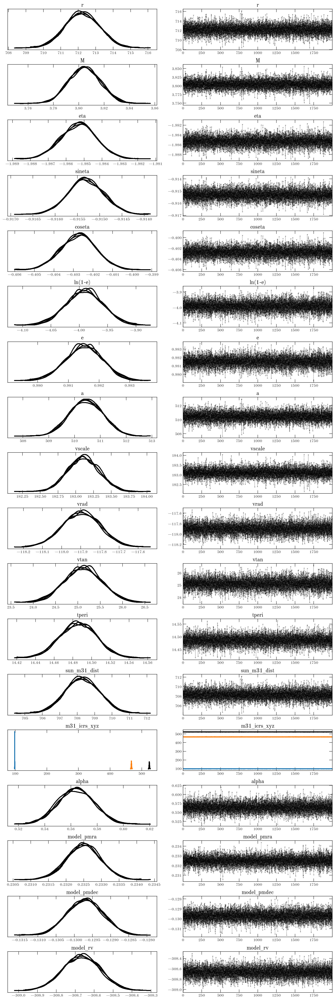

In [20]:
_ = az.plot_trace(samples)

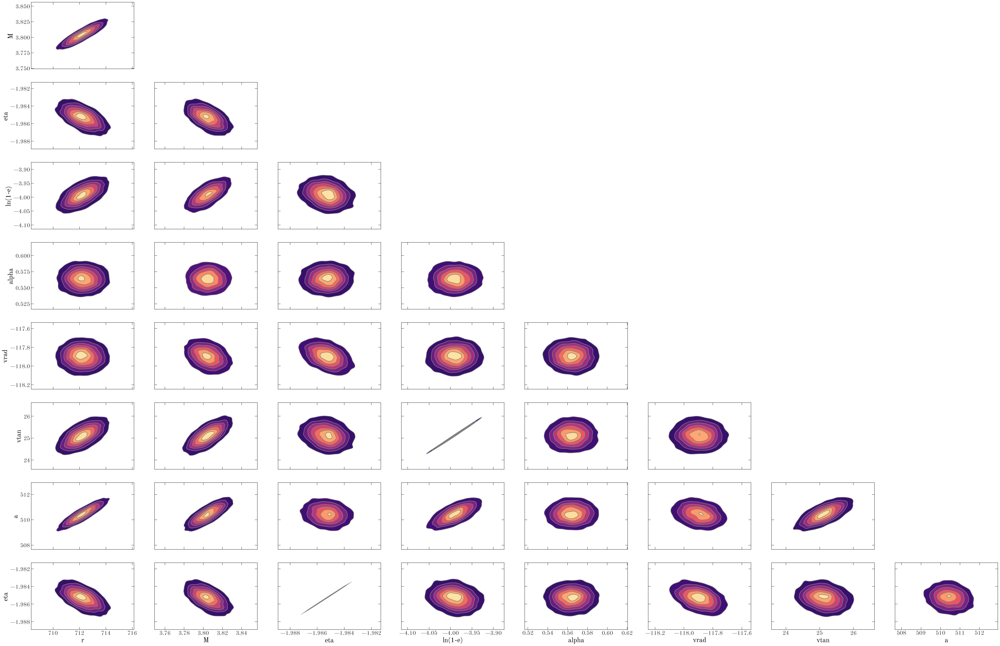

In [21]:
az.plot_pair(samples, kind='kde', 
             var_names=['r', 'M', 'eta', 'ln(1-e)', 'alpha',
                        'vrad', 'vtan', 'a', 'eta']);

---

## vrad/vtan-only model

In [33]:
data = at.QTable.read('../datasets/apw-simulated-simple.ecsv')[0]
data

vrad,vrad_err,vtan,vtan_err,r,r_err,tperi,tperi_err
km / s,km / s,km / s,km / s,kpc,kpc,Gyr,Gyr
float64,float64,float64,float64,float64,float64,float64,float64
-115.06625881297693,1.0,23.864207929180218,1.0,712.6674689669495,1.0,14.618692317765307,0.1


In [34]:
with pm.Model() as model:
    init_kepler(m31_sky_c=fiducial_m31_c, 
                galcen_frame=coord.Galactocentric(), 
                units=usys)

    # van der Marel et al. 2012:
#     pm.Normal('tperi_L', model.named_vars['tperi'], 
#               observed=13.75, sd=0.11)
#     pm.Normal('r_L', model.named_vars['r'], 
#               observed=770, sd=40.)
#     pm.Normal('vrad_L', model.named_vars['vrad'], 
#               observed=-109, sd=4.4)
#     pm.Normal('vtan_L', model.named_vars['vtan'], 
#               observed=0, sd=1)
    
    # Simulated:
    
    pm.Normal('tperi_L', model.named_vars['tperi'], 
              observed=data['tperi'].decompose(usys).value, 
              sd=data['tperi_err'].decompose(usys).value)
    
    pm.Normal('r_L', model.named_vars['r'], 
              observed=data['r'].decompose(usys).value, 
              sd=data['r_err'].decompose(usys).value)
    
    pm.Normal('vrad_L', model.named_vars['vrad'], 
              observed=data['vrad'].decompose(usys).value, 
              sd=data['vrad_err'].decompose(usys).value)
    
    pm.Normal('vtan_L', model.named_vars['vtan'], 
              observed=data['vtan'].decompose(usys).value, 
              sd=data['vtan_err'].decompose(usys).value)
    
    res = pmx.optimize(start={'r': 770., 
                              'M': 4, 
                              'eta': 4.2, 
                              'ln(1-e)': -3})
    print(res)
    
    samples = pmx.sample(return_inferencedata=True, 
                         start=res, tune=2000, draws=2000)

optimizing logp for variables: [ln(1-e), eta, M, r]


message: Optimization terminated successfully.
logp: -1844.8525234244664 -> 13.204301211531678


{'r_interval__': array(-2.71857795), 'M_interval__': array(-1.60204096), 'eta_angle__': array([-4.09896685, -1.78842689]), 'ln(1-e)_interval__': array(0.39124969), 'r': array(712.67113779), 'M': array(3.77008283), 'eta': array(-1.98220888), 'ln(1-e)': array(-4.034165), 'e': array(0.98229955), 'a': array(511.67279977), 'vscale': array(182.05945852), 'vrad': array(-117.68463336), 'vtan': array(24.48461326), 'tperi': array(14.61812957)}


Multiprocess sampling (4 chains in 4 jobs)
NUTS: [ln(1-e), eta, M, r]


Sampling 4 chains for 2_000 tune and 2_000 draw iterations (8_000 + 8_000 draws total) took 27 seconds.


In [35]:
samples.posterior.M.mean()

<xarray.DataArray 'M' ()>
array(3.77033093)

In [36]:
truths = simulated_truths.copy()
for k in list(samples.posterior.data_vars):
    truths.setdefault(k, np.nan)

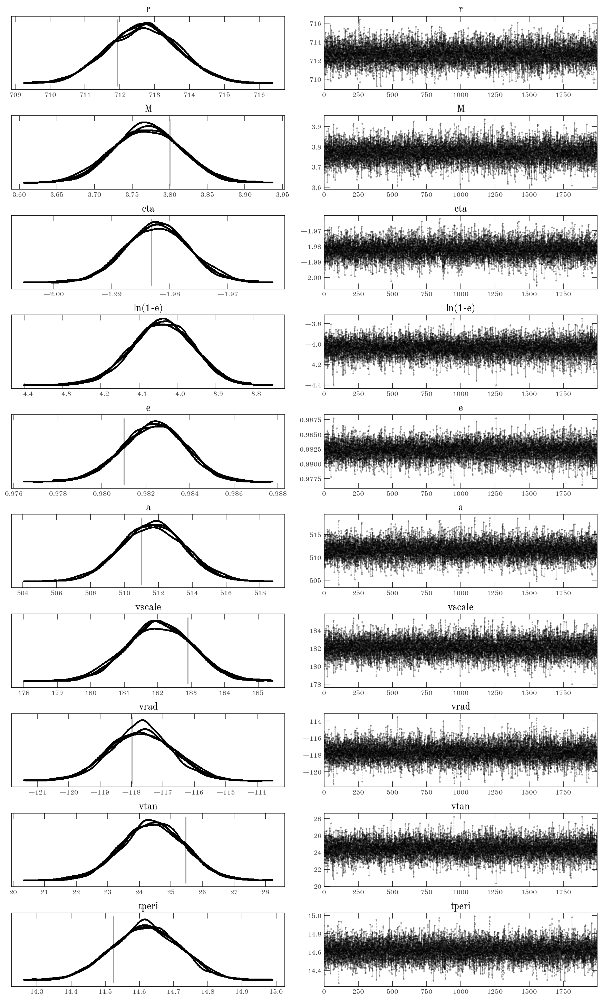

In [37]:
_ = az.plot_trace(samples, lines=[(k, {}, v) 
                                  for k, v in truths.items() 
                                  if np.isfinite(v)])

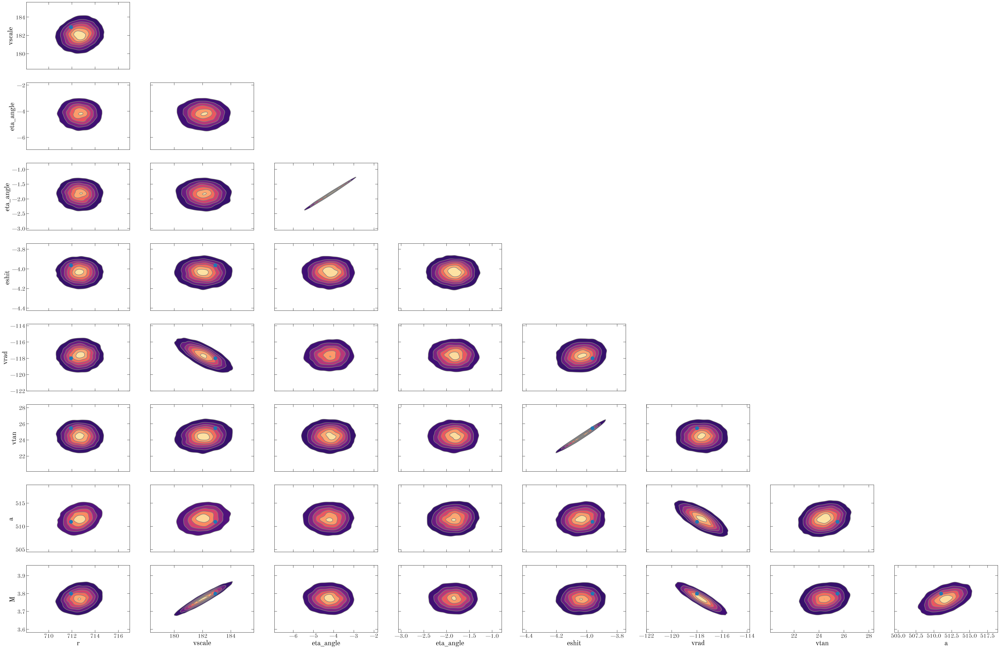

In [357]:
az.plot_pair(samples, kind='kde', 
             # var_names=['r', 'M', 'eta', 'eshit', 'vrad', 'vtan', 'a'],
             var_names=['r', 'vscale', 'eta_angle', 'ln(1-e)', 
                        'vrad', 'vtan', 'a', 'M', 'eta'],
             reference_values=truths, 
             reference_values_kwargs={'color': 'tab:blue', 'ms': 12, 'zorder': 100});

---

# Graveyard ⚰️🕸

In [5]:
# Matrix to go from ICRS to Galactocentric
R_I2G, offset_I2G = coord.builtin_frames.galactocentric.get_matrix_vectors(
    galcen_frame, inverse=False)
dxyz_I2G = offset_I2G.xyz.to_value(usys['length'])
dvxyz_I2G = offset_I2G.differentials['s'].d_xyz.to_value(usys['velocity'])

# Matrix to go from Galactocentric to ICRS
R_G2I, offset_G2I = coord.builtin_frames.galactocentric.get_matrix_vectors(
    galcen_frame, inverse=True)
dxyz_G2I = offset_G2I.xyz.to_value(usys['length'])
dvxyz_G2I = offset_G2I.differentials['s'].d_xyz.to_value(usys['velocity'])

m31_c = coord.SkyCoord(tbl['ra'], tbl['dec'])
m31_ra_rad = tbl['ra'].to_value(u.radian)
m31_dec_rad = tbl['dec'].to_value(u.radian)

In [6]:
# tangent bases: ra, dec, r
M = np.array([
    [-np.sin(m31_ra_rad), np.cos(m31_ra_rad), 0.],
    [-np.sin(m31_dec_rad)*np.cos(m31_ra_rad), -np.sin(m31_dec_rad)*np.sin(m31_ra_rad), np.cos(m31_dec_rad)],
    [np.cos(m31_dec_rad)*np.cos(m31_ra_rad), np.cos(m31_dec_rad)*np.sin(m31_ra_rad), np.sin(m31_dec_rad)]
])
M

array([[-0.18474534,  0.98278643,  0.        ],
       [-0.64779706, -0.12177365,  0.75201739],
       [ 0.73907248,  0.13893171,  0.65914327]])

In [7]:
with u.set_enabled_equivalencies(u.dimensionless_angles()):
    v_per_D_to_masyr = (usys['velocity'] / usys['length']).to(u.mas/u.yr)
    v_to_kms = usys['velocity'].to(u.km/u.s)
v_per_D_to_masyr, v_to_kms

(0.20626480624709637, 0.9777922216807892)

In [8]:
with pm.Model() as model:
    init_kepler(m31_sky_c=fiducial_m31_c, 
                galcen_frame=coord.Galactocentric(), 
                unit_system=usys)
    
    # Coordinate system orientation:
    alpha = pmx.Angle('alpha')
    
    m31_icrs_xyz = tt_sph_to_xyz(model.named_vars['sun_m31_dist'], 
                                 m31_ra_rad, m31_dec_rad)
    m31_galcen_xyz = tt.dot(R_I2G, m31_icrs_xyz) + dxyz_I2G
    m31_galcen_lon = tt.arctan2(m31_galcen_xyz[1], m31_galcen_xyz[0])
    m31_galcen_lat = tt.arcsin(m31_galcen_xyz[2] / model.named_vars['r'])
    
    xhat = m31_galcen_xyz / model.named_vars['r']

    Rz = tt_rotation_matrix(-m31_galcen_lon, 'z')
    Ry = tt_rotation_matrix(m31_galcen_lat, 'y')
    Rx = tt_rotation_matrix(alpha, 'x')
    yhat = tt.dot(tt.dot(Rz, tt.dot(Ry, Rx)), [0, 1, 0.])
    zhat = tt_cross(xhat, yhat)
    R_LGtoG = tt.stack((xhat, yhat, zhat), axis=1)
    
    x_LG = tt.as_tensor([model.named_vars['r'], 0., 0.])
    v_LG = tt.as_tensor([model.named_vars['vrad'], model.named_vars['vtan'], 0.])
    
    # v_travel!
#     v_travel_galcen_lon = pm.Normal('v_travel_lon', 56., 9.)
#     v_travel_galcen_lat = pm.Normal('v_travel_lat', -34, 10.)
#     v_travel_galcen_mag = pm.Normal(
#         'v_travel_mag', 
#         (32. * u.km/u.s).to_value(usys['velocity']), 
#         (4. * u.km/u.s).to_value(usys['velocity'])
#     )
#     v_travel_galcen_xyz = tt_sph_to_xyz(
#         v_travel_galcen_mag, 
#         tt.deg2rad(v_travel_galcen_lon), 
#         tt.deg2rad(v_travel_galcen_lat)
#     )
    
#     # APW thinks this is a minus sign...
#     vtmp = tt.dot(R_LGtoG, v_LG)
#     vtmp = vtmp - vtravel.to(usys['velocity']).value
    vtmp = tt.dot(R_LGtoG, v_LG)
    
    x_I = tt.dot(R_G2I, tt.dot(R_LGtoG, x_LG)) + dxyz_G2I
    v_I = tt.dot(R_G2I, vtmp) + dvxyz_G2I
    v_I_tangent_plane = tt.dot(M, v_I)  # alpha, delta, radial
    
    model_pmra = pm.Deterministic(
        'sun_pmra', 
        v_I_tangent_plane[0] / model.named_vars['sun_m31_dist'] * v_per_D_to_masyr
    )
    model_pmdec = pm.Deterministic(
        'sun_pmdec',
        v_I_tangent_plane[1] / model.named_vars['sun_m31_dist'] * v_per_D_to_masyr
    )
    model_rv = pm.Deterministic(
        'sun_rv',
        v_I_tangent_plane[2] * v_to_kms
    )
    
#     # -----------------------
#     # Print a model parameter
#     #
#     point = {
#         'r': 740.,  
#         'M': 4.0, 
#         'eta': 4.2, 
#         'eshit': -3,
#         'alpha': 2.5
#     }
#     test = pmx.optimize(start=point, maxeval=1, verbose=False)
#     thing = pmx.eval_in_model(
#         tt.sqrt(tt.sum(x_I ** 2)),
#         point=test
#     )
#     print(thing)
    
#     thing = pmx.eval_in_model(
#         model.named_vars['sun_m31_dist'],
#         point=test
#     )
#     print(thing)
#     # -----------------------
    
    pm.Normal('LL_distance', model.named_vars['sun_m31_dist'],
              observed=tbl['distance'].to_value(u.kpc), 
              sd=tbl['distance_err'].to_value(u.kpc))
    
    pm.Normal('LL_tperi', model.named_vars['tperi'], 
              observed=tbl['tperi'].to_value(u.Gyr), 
              sd=tbl['tperi_err'].to_value(u.Gyr))
    
    pm.Normal('LL_pmra', model_pmra,
              observed=tbl['pm_ra_cosdec'].to_value(u.mas/u.yr), 
              sd=tbl['pm_ra_cosdec_err'].to_value(u.mas/u.yr))
    
    pm.Normal('LL_pmdec', model_pmdec,
              observed=tbl['pm_dec'].to_value(u.mas/u.yr), 
              sd=tbl['pm_dec_err'].to_value(u.mas/u.yr))
    
    pm.Normal('LL_radial_velocity', model_rv,
              observed=tbl['radial_velocity'].to_value(u.km/u.s), 
              sd=tbl['radial_velocity_err'].to_value(u.km/u.s))
    
    start = {
        'r': 770.,  
        'M': 4.2, 
        'eta': 4.5,
        'eshit': -3,
        'alpha': 0.5
    }
    res2 = pmx.optimize(start=start)
    print(repr(res2))
    
    samples2 = pmx.sample(return_inferencedata=True, 
                          start=res2, tune=4000, draws=2000)

optimizing logp for variables: [alpha, ln(1-e), eta, M, r]


message: Optimization terminated successfully.
logp: -64653.981177958194 -> 52.30157692450981


{'r_interval__': array(-2.71930309), 'M_interval__': array(-4.17115693), 'eta_angle__': array([-3.5007818 , -2.30676788]), 'ln(1-e)_interval__': array(1.64571088), 'alpha_angle__': array([2.39014098, 3.77984472]), 'r': array(712.25449268), 'M': array(0.79639598), 'eta': array(-2.15342318), 'sineta': array(-3.5007818), 'coseta': array(-2.30676788), 'ln(1-e)': array(-1.6168948), 'e': array(0.80148583), 'a': array(250.01546228), 'vscale': array(119.7057635), 'vrad': array(-117.89832186), 'vtan': array(25.12799939), 'tperi': array(14.48555585), 'sun_m31_dist': array(708.30914254), 'alpha': array(0.56385897), 'sun_pmra': array(0.04795756), 'sun_pmdec': array(-0.02675443), 'sun_rv': array(-301.81311446)}


Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alpha, ln(1-e), eta, M, r]


Sampling 4 chains for 4_000 tune and 2_000 draw iterations (16_000 + 8_000 draws total) took 83 seconds.
There were 24 divergences after tuning. Increase `target_accept` or reparameterize.
There were 142 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.8304409299799856, but should be close to 0.9. Try to increase the number of tuning steps.
There were 56 divergences after tuning. Increase `target_accept` or reparameterize.
There were 27 divergences after tuning. Increase `target_accept` or reparameterize.
The number of effective samples is smaller than 10% for some parameters.
